In [1]:
import pandas as pd
from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet
from statsmodels.tools.eval_measures import rmse
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
from prophet.serialize import model_to_json, model_from_json

import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

df = pd.read_csv('/Users/alanchan/Documents/UCL/Year 4/ELEC0088/SNS assignment 22-23/London Weather data/london_weather.csv')
# print(df.info())
df.dropna(inplace= True)
df.reset_index(drop=True, inplace=True)
# print(df.info())

In [2]:
# print(df.tail())
df = df.rename(columns={'mean_temp': 'y', 'date':'ds'})
# df = df[-2000:]
# df=df[["date","mean_temp","pressure"]]
# df.columns = ['ds','y',"pressure"]
df['ds'] = pd.to_datetime(df['ds'], format='%Y%m%d')
# print(df.tail())

In [3]:
df.sort_values(by='ds', inplace = True)
df.reset_index(drop=True, inplace=True)
# print(df.head())
# print(df.tail())

13843


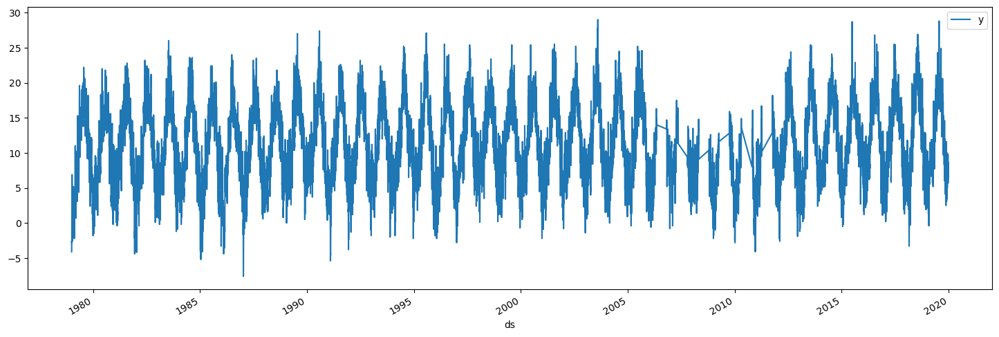

In [4]:
df.plot(x='ds',y='y',figsize=(18,6))
print(len(df))

In [5]:
Test_split = 365
train = df.iloc[:len(df)-Test_split]
test = df.iloc[len(df)-Test_split:]

print(len(train))
print(len(test))

# print(df.tail())

13478
365


In [6]:
def preprocessing (multi_var,periods):
    t = train[['ds',multi_var]]
    t = t.rename(columns={multi_var: 'y', 'date':'ds'})
    model = Prophet()
    model.fit(t)
    future = model.make_future_dataframe(periods=periods)
    forecast = model.predict(future)
    return forecast['yhat']

def cross_valid_check(train, df_p, periods):
    best_feature = None
    lowest = df_p.iloc[-1]['mape']
    for column in train.loc[:, ~train.columns.isin(['ds', 'y'])].columns:
        m_cross_valid = Prophet()
        m_cross_valid.add_regressor(column)
        m_cross_valid.fit(train)
        print('Cross validating model with dataset: '+ column)
        
        df_cv_cross_valid = cross_validation(m_cross_valid, initial='14209 days', period='180 days', horizon = '365 days')
        df_p_cross_valid = performance_metrics(df_cv_cross_valid)
        if df_p_cross_valid.iloc[-1]['mape'] < lowest:
            print(lowest ,df_p_cross_valid.iloc[-1]['mape'])
            lowest = df_p_cross_valid.iloc[-1]['mape']
            print(column+' is better')
            best_feature = column
    print('\n')
    return best_feature

19:00:19 - cmdstanpy - INFO - Chain [1] start processing
19:00:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

19:00:21 - cmdstanpy - INFO - Chain [1] start processing
19:00:22 - cmdstanpy - INFO - Chain [1] done processing


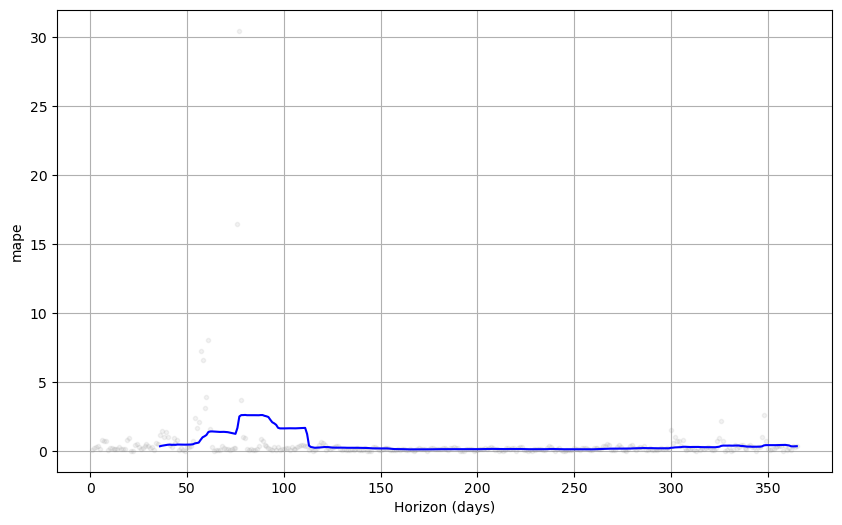

In [7]:
periods = 365*2
m = Prophet()
m.fit(train)
# future = m.make_future_dataframe(periods=periods)
# forecast = m.predict(future)
df_cv = cross_validation(m, initial='14209 days', period='180 days', horizon = '365 days')
df_p = performance_metrics(df_cv)
fig = plot_cross_validation_metric(df_cv, metric='mape')

In [8]:
m = Prophet()
best_feature = cross_valid_check(train, df_p, periods)
m.add_regressor(str(best_feature))
print(best_feature +' added to the model')
m.fit(train)
future = m.make_future_dataframe(periods=periods)
future[best_feature] = preprocessing(best_feature,periods)
print (best_feature+ ' predicted ')
forecast = m.predict(future)
print('Forecasting the temperature')

19:00:23 - cmdstanpy - INFO - Chain [1] start processing
19:00:25 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: cloud_cover


  0%|          | 0/1 [00:00<?, ?it/s]

19:00:26 - cmdstanpy - INFO - Chain [1] start processing
19:00:27 - cmdstanpy - INFO - Chain [1] done processing


0.32975674612982614 0.3218612695693499
cloud_cover is better


19:00:28 - cmdstanpy - INFO - Chain [1] start processing
19:00:29 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: sunshine


  0%|          | 0/1 [00:00<?, ?it/s]

19:00:30 - cmdstanpy - INFO - Chain [1] start processing
19:00:32 - cmdstanpy - INFO - Chain [1] done processing
19:00:33 - cmdstanpy - INFO - Chain [1] start processing
19:00:34 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: global_radiation


  0%|          | 0/1 [00:00<?, ?it/s]

19:00:35 - cmdstanpy - INFO - Chain [1] start processing
19:00:36 - cmdstanpy - INFO - Chain [1] done processing
19:00:37 - cmdstanpy - INFO - Chain [1] start processing
19:00:39 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: max_temp


  0%|          | 0/1 [00:00<?, ?it/s]

19:00:40 - cmdstanpy - INFO - Chain [1] start processing
19:00:41 - cmdstanpy - INFO - Chain [1] done processing


0.3218612695693499 0.27912503514092996
max_temp is better


19:00:42 - cmdstanpy - INFO - Chain [1] start processing
19:00:43 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: min_temp


  0%|          | 0/1 [00:00<?, ?it/s]

19:00:44 - cmdstanpy - INFO - Chain [1] start processing
19:00:46 - cmdstanpy - INFO - Chain [1] done processing


0.27912503514092996 0.11252839609450731
min_temp is better


19:00:47 - cmdstanpy - INFO - Chain [1] start processing
19:00:48 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: precipitation


  0%|          | 0/1 [00:00<?, ?it/s]

19:00:49 - cmdstanpy - INFO - Chain [1] start processing
19:00:50 - cmdstanpy - INFO - Chain [1] done processing
19:00:51 - cmdstanpy - INFO - Chain [1] start processing
19:00:53 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: pressure


  0%|          | 0/1 [00:00<?, ?it/s]

19:00:54 - cmdstanpy - INFO - Chain [1] start processing
19:00:55 - cmdstanpy - INFO - Chain [1] done processing
19:00:56 - cmdstanpy - INFO - Chain [1] start processing
19:00:57 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: snow_depth


  0%|          | 0/1 [00:00<?, ?it/s]

19:00:58 - cmdstanpy - INFO - Chain [1] start processing
19:00:59 - cmdstanpy - INFO - Chain [1] done processing




min_temp added to the model


19:01:00 - cmdstanpy - INFO - Chain [1] start processing
19:01:02 - cmdstanpy - INFO - Chain [1] done processing
19:01:02 - cmdstanpy - INFO - Chain [1] start processing
19:01:03 - cmdstanpy - INFO - Chain [1] done processing


min_temp predicted 
Forecasting the temperature


In [9]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
14203,2020-12-26,6.835351,5.121560,8.664901
14204,2020-12-27,6.847124,5.097247,8.605056
14205,2020-12-28,6.837360,4.926530,8.648310
14206,2020-12-29,6.804606,5.085821,8.553447
14207,2020-12-30,6.823654,4.975627,8.478042


In [10]:
plot_plotly(m ,forecast)

In [11]:
plot_components_plotly(m, forecast)

In [12]:
predictions = forecast.iloc[len(train):len(train)+len(test)]['yhat']
print("Root Mean Squared Error between actual and  predicted values: ",rmse(predictions,test['y']))
print("Mean Value of Test Dataset:", test['y'].mean())

Root Mean Squared Error between actual and  predicted values:  2.584232795695994
Mean Value of Test Dataset: 12.193972602739736


In [13]:
training = forecast.iloc[:len(train)]['yhat']
print("Root Mean Squared Error between actual and  predicted values: ",rmse(training,train['y']))

Root Mean Squared Error between actual and  predicted values:  2.8691043663452853


In [15]:
with open('model_multi_prophet_weather_cross_validation_model.json', 'w') as fout:
    fout.write(model_to_json(m))